In [ ]:
#importing required files
import os
import cv2
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from skimage import io
from skimage.color import rgb2gray
from skimage.feature import hog
from scipy.io import loadmat
import pandas as pd
import seaborn as sns
#sns.set_style('darkgrid')
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
from tqdm import tqdm as tqdm
import torchvision
import torch
import torch.nn.functional as F
from torchvision import transforms
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
import math
import random
import scipy.io as io
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import confusion_matrix


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data = loadmat("/content/drive/MyDrive/Semester5/dip/2015_BOE_Chiu/Subject_01.mat")

In [ ]:
input_path = "/content/drive/MyDrive/Semester5/dip/2015_BOE_Chiu/"
subject_path = [os.path.join(input_path, 'Subject_0{}.mat'.format(i)) for i in range(1, 10)] + [os.path.join(input_path, 'Subject_10.mat')]
data_indexes = [10, 15, 20, 25, 28, 30, 32, 35, 40, 45, 50]

##Data Understanding

In [ ]:
print(data)

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Sat Mar 07 12:12:16 2015', '__version__': '1.0', '__globals__': [], 'images': array([[[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]],

       [[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]],

       [[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]],

In [ ]:
original_images = []
target_images = []

for subject_file_path in subject_path:
    mat = scipy.io.loadmat(subject_file_path)
    img_tensor = mat['images']
    manual_fluid_tensor_1 = mat['manualFluid1']

    img_array = np.transpose(img_tensor, (2, 0, 1))
    original_image = img_array[data_indexes[3]]
    original_images.append(original_image)

    manual_fluid_array = np.transpose(manual_fluid_tensor_1, (2, 0, 1))
    target_image = manual_fluid_array[data_indexes[3]]
    target_images.append(target_image)

In [ ]:
n = len(original_images)
print(f'Total no of images in dataset : {n}')

Total no of images in dataset : 10


In [ ]:
testing = [3,4,6,7]
training = [0,1,2,5,8,9]

testing_original_images = [original_images[i] for i in testing]
testing_target_images = [target_images[i] for i in testing]

training_original_images = [original_images[i] for i in training]
training_target_images = [target_images[i] for i in training]

tn = len(training_original_images)
tt = len(testing_original_images)

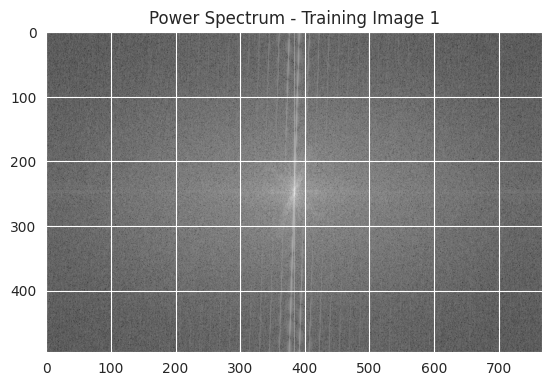

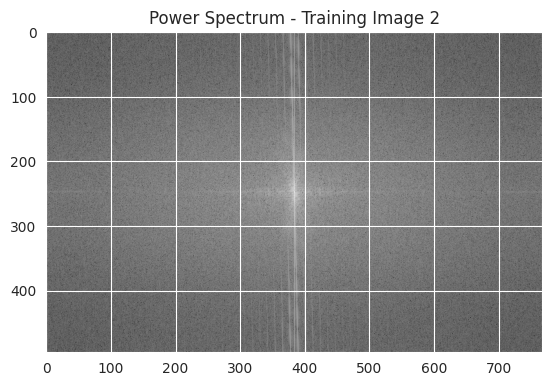

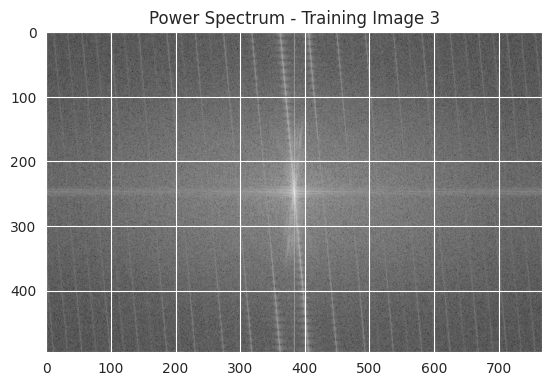

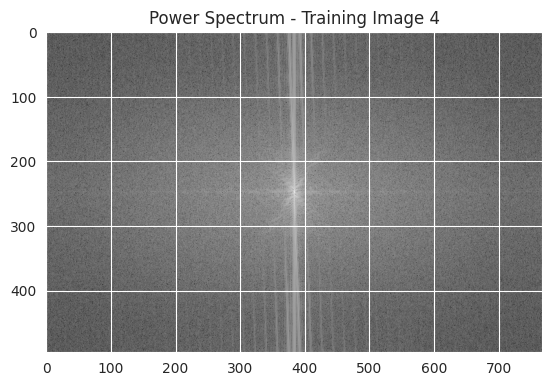

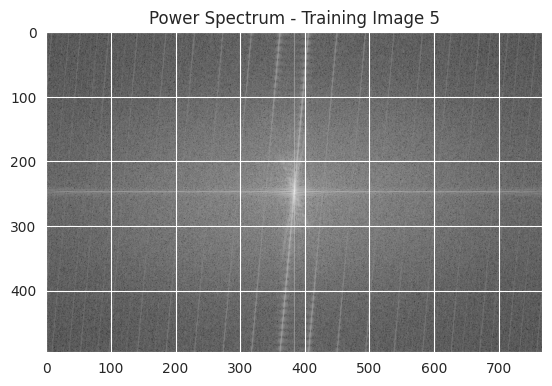

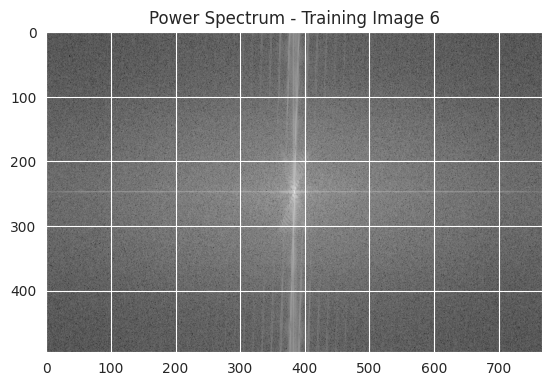

In [ ]:
def plot_power_spectrum(img, title):
    f_transform = np.fft.fft2(img)
    power_spectrum = np.fft.fftshift(np.abs(f_transform))

    plt.imshow(np.log(1 + power_spectrum), cmap='gray')
    plt.title(title)
    plt.show()

for i, img in enumerate(training_original_images):
    plot_power_spectrum(img, f'Power Spectrum - Training Image {i + 1}')


In [ ]:
print(f'Total no of images in training is {tn} and in testing is {tt}')

Total no of images in training is 6 and in testing is 4


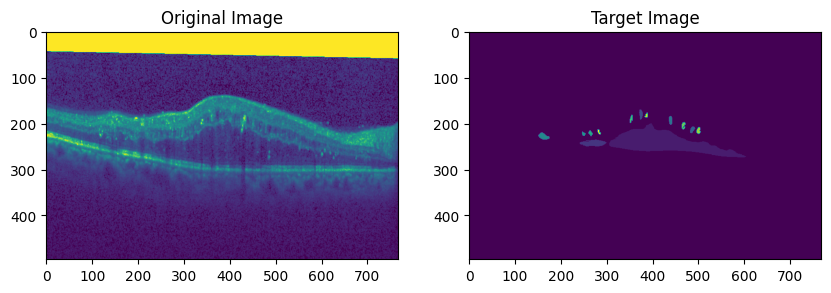

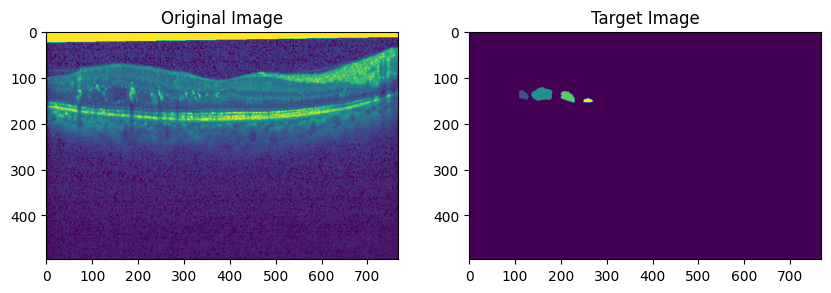

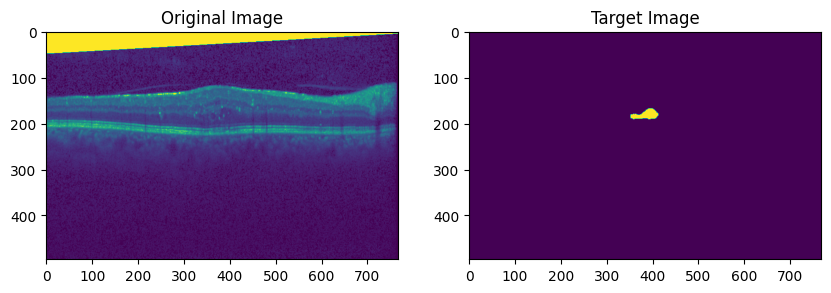

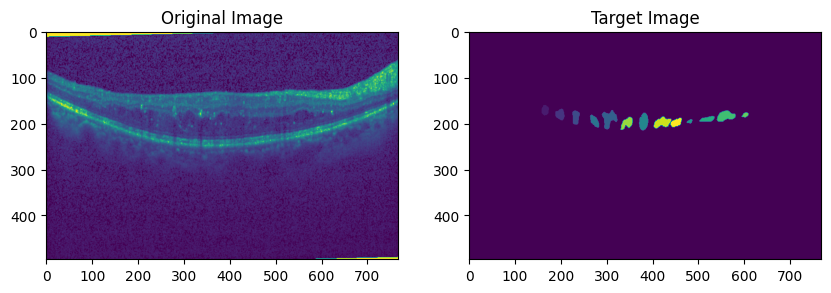

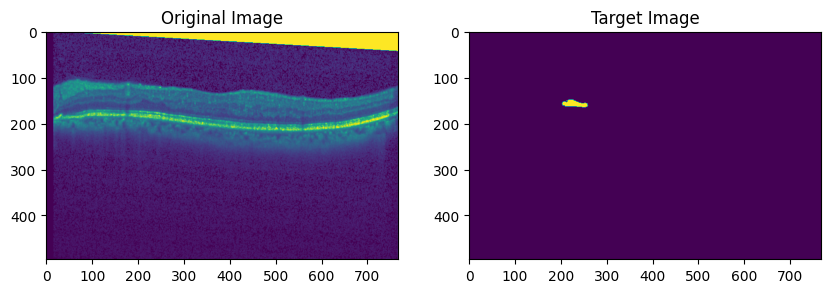

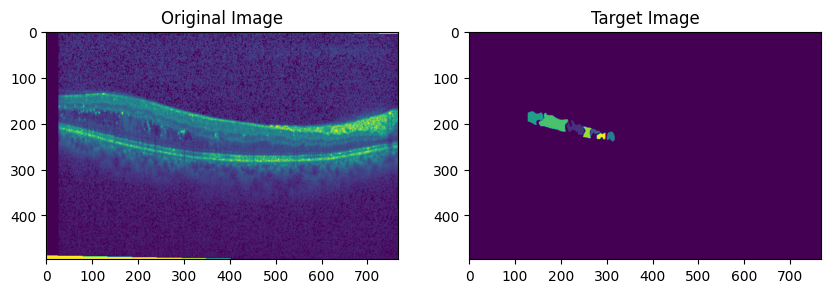

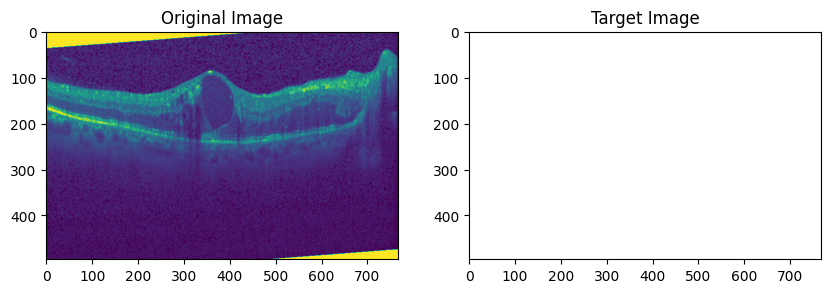

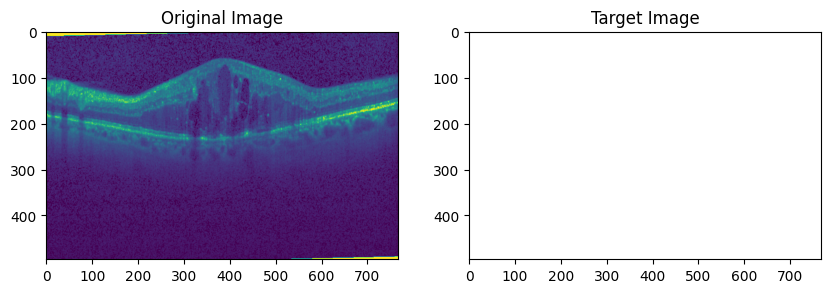

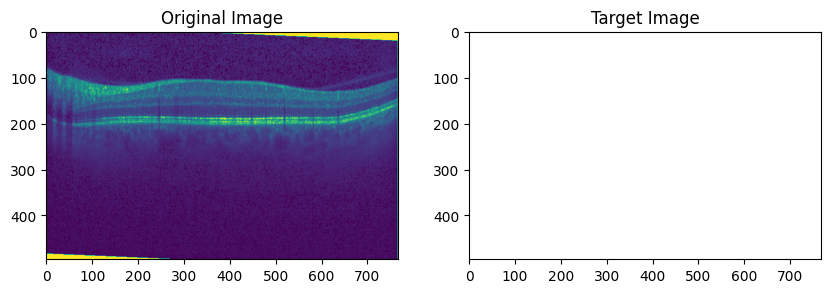

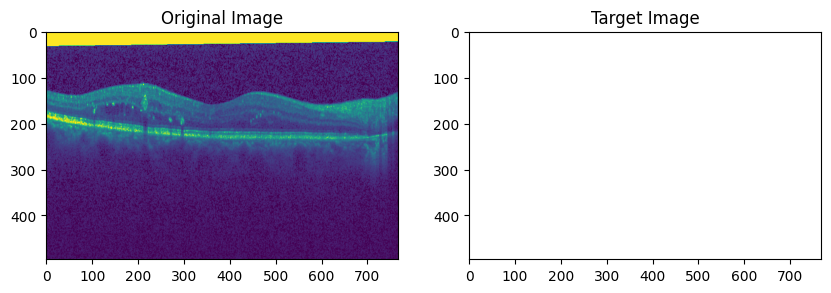

In [ ]:
for i in range(len(training)):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(training_original_images[i])
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.imshow(training_target_images[i])
    plt.title('Target Image')

    plt.show()

for i in range(len(testing)):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(testing_original_images[i])
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.imshow(testing_target_images[i])
    plt.title('Target Image')

    plt.show()

In [ ]:
image_dimensions = img_array.shape
print("Image Dimensions (channel, height, width):", image_dimensions)

Image Dimensions (channel, height, width): (61, 496, 768)


## Data Preprocessing

In [ ]:
def preprocess_image(image):
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

    unsharp_mask = image - blurred_image

    sharpened_image = np.clip(image + 0.5 * unsharp_mask, 0, 255).astype(np.uint8)

    return blurred_image, sharpened_image

blurred_images = []
sharpened_images = []

for original_image in original_images:
    blurred, sharpened = preprocess_image(original_image)
    blurred_images.append(blurred)
    sharpened_images.append(sharpened)

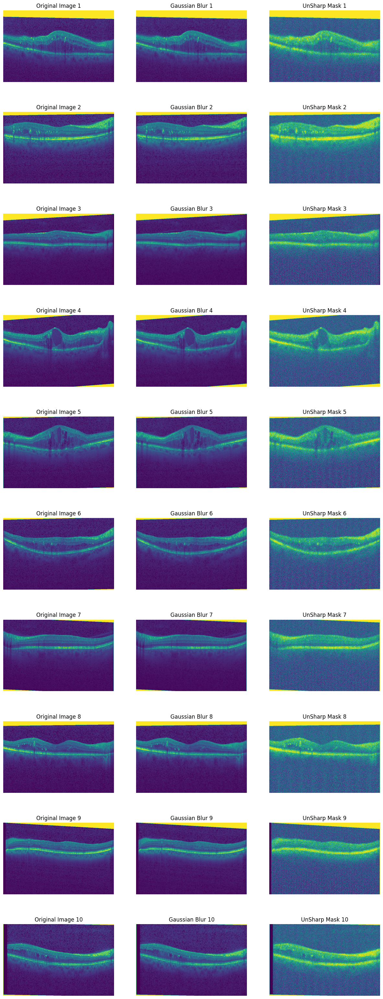

In [ ]:
plt.style.use('default')
plt.figure(figsize=(15, 40))

for i in range(len(subject_path)):

    plt.subplot(len(subject_path), 3, 3*i+1)
    plt.imshow(original_images[i])
    plt.title(f'Original Image {i+1}')
    plt.axis('off')

    plt.subplot(len(subject_path), 3, 3*i+2)
    plt.imshow(blurred_images[i])
    plt.title(f'Gaussian Blur {i+1}')
    plt.axis('off')

    plt.subplot(len(subject_path), 3, 3*i+3)
    plt.imshow(sharpened_images[i])
    plt.title(f'UnSharp Mask {i+1}')
    plt.axis('off')


plt.show()

In [ ]:
def preprocess_image(image):

    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

    laplacian_image = cv2.Laplacian(blurred_image, cv2.CV_64F)
    sharpened_image = np.clip(image - 0.7 * laplacian_image, 0, 255).astype(np.uint8)
    return blurred_image, sharpened_image

blurred_images = []
sharpened_images = []


for original_image in original_images:
    blurred, sharpened = preprocess_image(original_image)
    blurred_images.append(blurred)
    sharpened_images.append(sharpened)


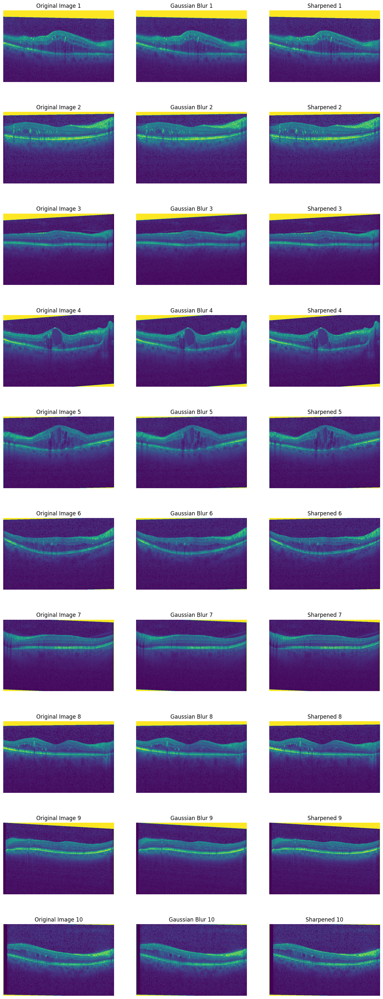

In [ ]:
plt.figure(figsize=(15, 40))

for i in range(len(subject_path)):

    plt.subplot(len(subject_path), 3, 3*i+1)
    plt.imshow(original_images[i])
    plt.title(f'Original Image {i+1}')
    plt.axis('off')

    plt.subplot(len(subject_path), 3, 3*i+2)
    plt.imshow(blurred_images[i])
    plt.title(f'Gaussian Blur {i+1}')
    plt.axis('off')

    plt.subplot(len(subject_path), 3, 3*i+3)
    plt.imshow(sharpened_images[i])
    plt.title(f'Sharpened {i+1}')
    plt.axis('off')


plt.show()

## Segmentation

### Method 01 : U-NET

In [ ]:
def preprocess_image(image):

    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

    laplacian_image = cv2.Laplacian(blurred_image, cv2.CV_64F)
    sharpened_image = np.clip(image - 0.7 * laplacian_image, 0, 255).astype(np.uint8)


    return image

In [ ]:
testing_original=[]
training_original = []

for tt in testing_original_images:
  processed = preprocess_image(tt)
  testing_original.append(processed)

for tr in training_original_images:
  processed = preprocess_image(tr)
  training_original.append(processed)

training_target = training_target_images
testing_target = testing_target_images

In [ ]:
new_height = 284
new_width = 284

resized_training_original = [cv2.resize(img, (new_width, new_height))[..., np.newaxis] for img in training_original]

resized_training_target = [cv2.resize(img, (new_width, new_height))[..., np.newaxis] for img in training_target]

resized_training_original_np = np.array(resized_training_original)
resized_training_target_np = np.array(resized_training_target)

def unet_model(input_size=(new_height, new_width, 1)):
    inputs = tf.keras.Input(shape=input_size)

    # Encoder
    conv1 = layers.Conv2D(64, 3, padding='same')(inputs)
    conv1 = layers.LeakyReLU(alpha=0.2)(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Conv2D(64, 3, padding='same')(conv1)
    conv1 = layers.LeakyReLU(alpha=0.2)(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, 3, padding='same')(pool1)
    conv2 = layers.LeakyReLU(alpha=0.2)(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Conv2D(128, 3, padding='same')(conv2)
    conv2 = layers.LeakyReLU(alpha=0.2)(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, 3, padding='same')(pool2)
    conv3 = layers.LeakyReLU(alpha=0.2)(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Conv2D(256, 3, padding='same')(conv3)
    conv3 = layers.LeakyReLU(alpha=0.2)(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)


    # Decoder
    up4 = layers.UpSampling2D(size=(2, 2))(conv3)
    up4 = layers.concatenate([up4, conv2], axis=-1)
    conv4 = layers.Conv2D(128, 3, padding='same')(up4)
    conv4 = layers.LeakyReLU(alpha=0.2)(conv4)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Conv2D(128, 3, padding='same')(conv4)
    conv4 = layers.LeakyReLU(alpha=0.2)(conv4)
    conv4 = layers.BatchNormalization()(conv4)

    up5 = layers.UpSampling2D(size=(2, 2))(conv4)
    up5 = layers.concatenate([up5, conv1], axis=-1)
    conv5 = layers.Conv2D(64, 3, padding='same')(up5)
    conv5 = layers.LeakyReLU(alpha=0.2)(conv5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Conv2D(64, 3, padding='same')(conv5)
    conv5 = layers.LeakyReLU(alpha=0.2)(conv5)
    conv5 = layers.BatchNormalization()(conv5)


    outputs = layers.Conv2D(1, 1, activation='sigmoid')(conv5)

    model = models.Model(inputs=inputs, outputs=outputs)

    return model

model = unet_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

epochs =380
batch_size = 32
model.fit(resized_training_original_np, resized_training_target_np, epochs=epochs, batch_size=batch_size)


In [ ]:
loaded_model.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 284, 284, 1)]        0         []                            
                                                                                                  
 conv2d_55 (Conv2D)          (None, 284, 284, 64)         640       ['input_6[0][0]']             
                                                                                                  
 leaky_re_lu_50 (LeakyReLU)  (None, 284, 284, 64)         0         ['conv2d_55[0][0]']           
                                                                                                  
 batch_normalization_50 (Ba  (None, 284, 284, 64)         256       ['leaky_re_lu_50[0][0]']      
 tchNormalization)                                                                          

1/1 [==============================] - 0s 19ms/step


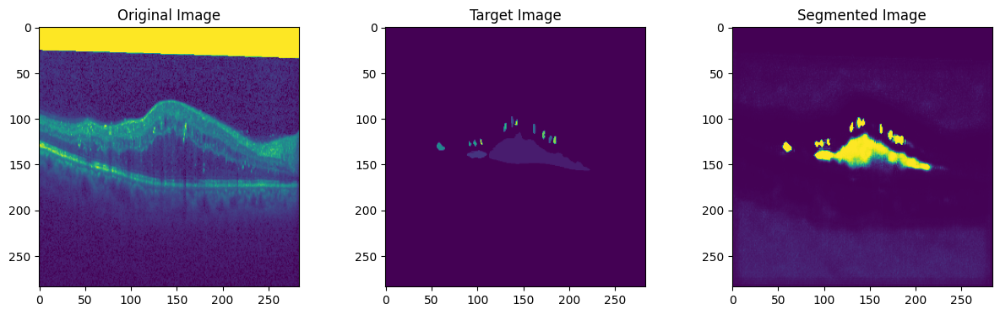

1/1 [==============================] - 0s 26ms/step


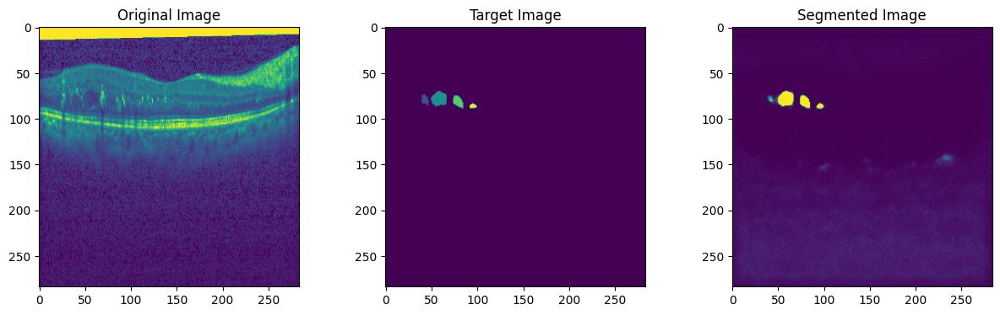

1/1 [==============================] - 0s 39ms/step


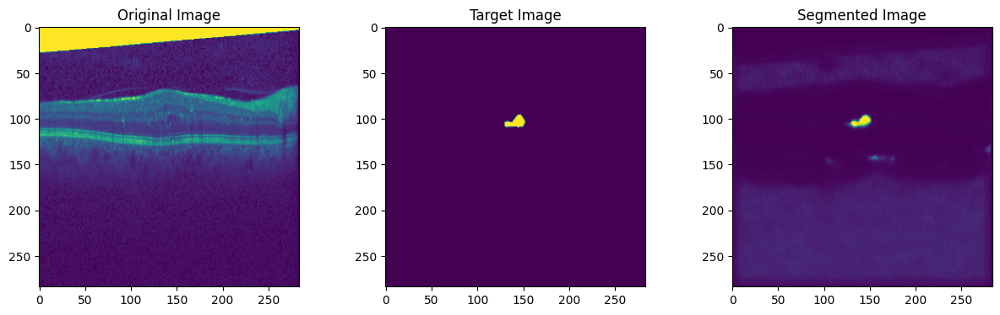

1/1 [==============================] - 0s 28ms/step


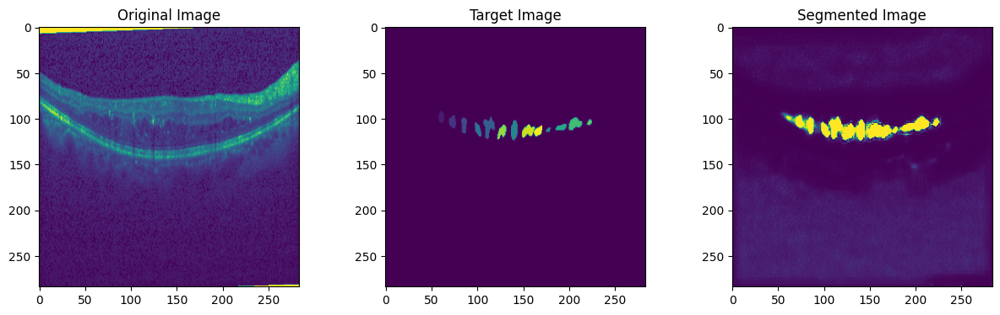

1/1 [==============================] - 0s 48ms/step


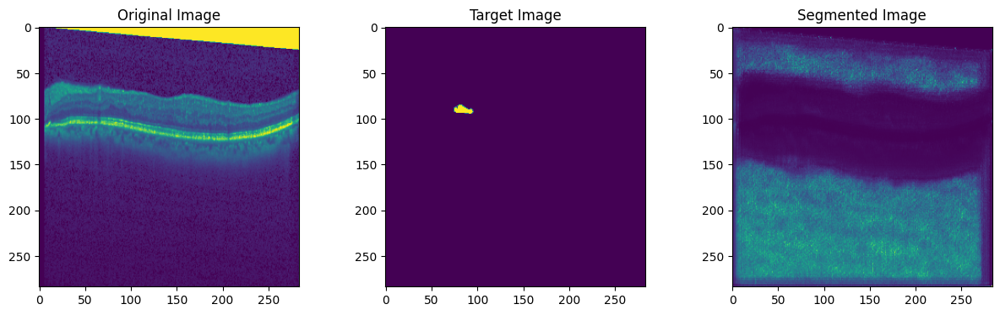

1/1 [==============================] - 0s 42ms/step


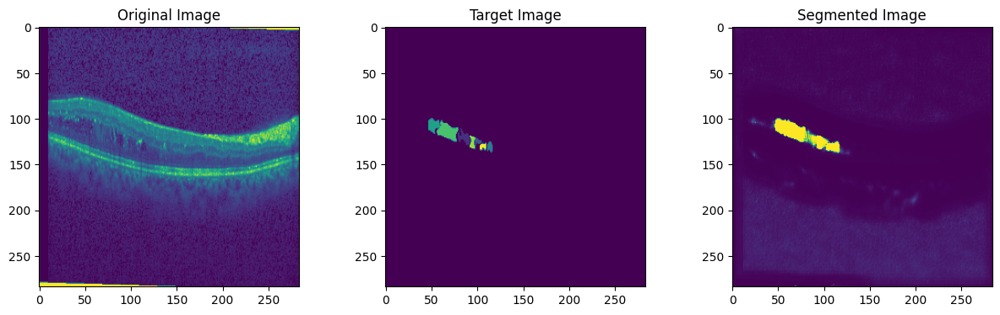

In [ ]:
for sample_index in range(6):
    predicted_segmentation = model.predict(resized_training_original_np[sample_index][np.newaxis, ...])

    plt.figure(figsize=(15, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(resized_training_original_np[sample_index]))
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(resized_training_target_np[sample_index]))
    plt.title('Target Image')

    plt.subplot(1, 3, 3)
    plt.imshow(np.squeeze(predicted_segmentation))
    plt.title('Segmented Image')

    plt.show()


### Method 02 : RCNN

In [ ]:
width = 284
height = 284
width_out = 196
height_out = 196

def check_for_nonzero(item):
    if torch.count_nonzero(item)!=0:
        return True
    return False

def resize(item,size):
    T = torchvision.transforms.Resize(size=(size,size),
                                      interpolation=transforms.InterpolationMode.BILINEAR,
                                      antialias=True)
    return T(item)


In [ ]:
class OCTDataset(Dataset):
    def __init__(self, root, transforms, size):
        self.root = root
        self.transforms = transforms
        self.subject_path = [os.path.join(self.root, 'Subject_0{}.mat'.format(i)) for i in range(1, 10)]+[os.path.join(input_path, 'Subject_10.mat')]

        self.size = size
        self.images = torch.tensor([])
        self.masks = torch.tensor([])
        self.y = []

        self.load_images_and_masks()

        print(self.images.size(), self.masks.size())

    def __len__(self):
        return len(self.images)


    def __getitem__(self, idx):
        img = self.images[idx]
        mask = self.masks[idx]

        obj_ids = mask.unique()
        obj_ids = obj_ids[1:]

        num_objs = len(obj_ids)

        masks = mask == obj_ids[:, None, None]

        boxes = []

        for i in range(num_objs):

            pos = torch.nonzero(masks[i])
            mins, _ = torch.min(pos, dim=0)
            maxs, _ = torch.max(pos, dim=0)

            xmin = mins[1]
            ymin = mins[0]

            xmax = maxs[1]
            ymax = maxs[0]

            boxes.append([xmin, ymin, xmax, ymax])


        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(obj_ids, dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)


        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

        pass

    def load_images_and_masks(self):

        for i in tqdm(range(len(self.subject_path))):

            mat = io.loadmat(self.subject_path[i])

            images = np.expand_dims(np.transpose(mat['images'], (2,0,1))/255, 0)
            y = np.transpose(mat['manualFluid1'], (2,0,1))
            masks = np.expand_dims(np.nan_to_num(y),0)

            images = torch.as_tensor(images, dtype=torch.float32)
            masks = torch.as_tensor(masks, dtype=torch.uint8)
            images = resize(images, self.size)
            masks = resize(masks, self.size)


            for idx in range(images.shape[1]):

                mask = masks[0][idx]
                if check_for_nonzero(mask):
                    temp1 = images[::, idx, ::]

                    temp2 = masks[0, idx, ::].unsqueeze(0)

                    img = torch.cat([temp1]*3).unsqueeze(0)

                    self.images = torch.cat((self.images, img))
                    self.masks = torch.cat((self.masks, temp2))

In [ ]:
OCT = OCTDataset("/content/drive/MyDrive/Semester5/dip/2015_BOE_Chiu",None,512)

In [ ]:
indices = torch.randperm(len(OCT)).tolist()
train_indices = indices[:-8]
test_indices = indices[-8:]

OCTrain = torch.utils.data.Subset(OCT, train_indices)
OCTest = torch.utils.data.Subset(OCT, test_indices)

In [ ]:
def get_model_instance_segmentation(num_classes):
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")

    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 128
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model

In [ ]:
model = get_model_instance_segmentation(16)
print('model loaded')

In [ ]:
model.to(device)

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [ ]:
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=1e-4)
lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min')

In [ ]:
num_epochs = 500
model.train()
loss_list = []
epochs = []
save_interval = 10

for epoch in tqdm(range(num_epochs)):
    random.shuffle(train_indices)
    OCTrain = torch.utils.data.Subset(OCT, train_indices)

    optimizer.zero_grad()

    for images, targets in OCTrain:
        images = [images.to(device)]
        targets = [{k: v.to(device) for k, v in targets.items()}]
        output = model(images, targets)
        loss = sum(losses for losses in output.values())

    loss.backward()
    optimizer.step()

    if epoch % 10 == 0:
        epochs.append(epoch)
        loss_list.append(loss.item())

    if epoch % save_interval == 0:
        torch.save(model.state_dict(), f'/content/drive/MyDrive/2015_BOE_Chiu/model_epoch_{epoch}.pth')

torch.save(model.state_dict(), '/content/drive/MyDrive/2015_BOE_Chiu/final_model.pth')

100%|██████████| 500/500 [59:09<00:00,  7.10s/it]


In [ ]:
def output_mask(predicted, threshold_score, threshold_mask):
    masks = predicted[0]['masks']
    scores = predicted[0]['scores']

    masks = masks.squeeze(1)
    output = torch.zeros((512,512))
    for i in range(masks.size(0)):
        score_mask = []
        if scores[i]>threshold_score:
            score_mask = masks[i].cpu().detach()
            score_mask[score_mask>threshold_mask]=10
            score_mask[score_mask<=threshold_mask]=0
            output = torch.add(score_mask, output)
    return output*255


def plot_examples(datax, datay, num_examples=7):
    model.eval()
    fig, ax = plt.subplots(nrows=num_examples, ncols=3, figsize=(18,4*num_examples))
    m = len(datax)
    for row_num in range(num_examples):
        image_indx = np.random.randint(m)
        pred = model(datax[image_indx: image_indx+1].to(device))
        image_arr = output_mask(pred, 0.1, 0.2)
        ax[row_num][0].imshow(np.transpose(datax[image_indx], (1,2,0))[:,:,0])
        ax[row_num][0].set_title("Orignal Image")
        ax[row_num][1].imshow(image_arr)
        ax[row_num][1].set_title("Segmented Image")
        ax[row_num][2].imshow(datay[image_indx])
        ax[row_num][2].set_title("Target image")
    plt.show()

torch.Size([8, 3, 512, 512])
torch.Size([8, 512, 512])


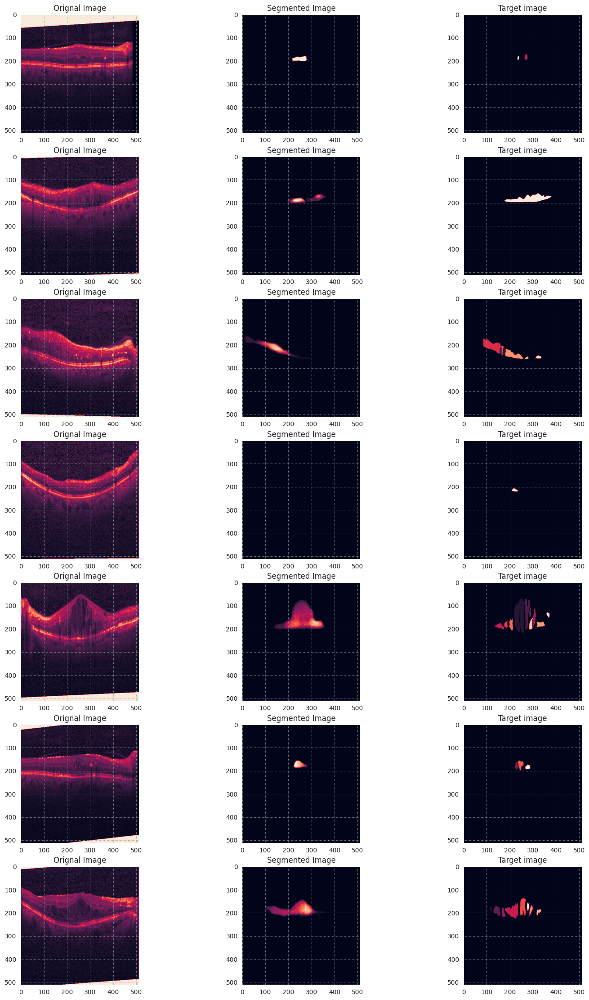

In [ ]:
sns.set_style("darkgrid", {"color":"0.2","grid.color": ".6", "grid.linestyle": ":"})

x_val = torch.tensor([])
y_val = torch.tensor([])
for index in test_indices:
    image = OCT.images[index].unsqueeze(0)
    x_val = torch.cat((x_val, image))
    target = OCT.masks[index].unsqueeze(0)
    y_val = torch.cat((y_val, target))

print(x_val.size())
print(y_val.size())
plot_examples(x_val, y_val)

## Evaluation

### Model 01

In [ ]:
resized_testing_original_np = [cv2.resize(img, (new_width, new_height))[..., np.newaxis] for img in testing_original]
resized_testing_target_np = [cv2.resize(img, (new_width, new_height))[..., np.newaxis] for img in testing_target]
resized_testing_original_np = np.array(resized_training_original)
resized_testing_target_np = np.array(resized_training_target)

results = loaded_model.evaluate(resized_testing_original_np, resized_testing_target_np)


In [ ]:
predictions = loaded_model.predict(resized_testing_original_np)

threshold = 0.5
binary_predictions = (predictions > threshold).astype(np.uint8)

ground_truth_flat = resized_testing_target_np.reshape(-1)
predictions_flat = binary_predictions.reshape(-1)

ground_truth_binary = (ground_truth_flat > 0.5).astype(int)
predictions_binary = (predictions_flat > threshold).astype(int)

conf_matrix = confusion_matrix(ground_truth_binary, predictions_binary)

true_positive = conf_matrix[1, 1]
false_positive = conf_matrix[0, 1]
false_negative = conf_matrix[1, 0]

iou = true_positive / (true_positive + false_positive + false_negative)

dice_coefficient = 2 * true_positive / (2 * true_positive + false_positive + false_negative)

precision = true_positive / (true_positive + false_positive)
recall = true_positive / (true_positive + false_negative)
f1_score = 2 * (precision * recall) / (precision + recall)



In [ ]:
print("Model 1 IoU:", iou)
print("Model 1 Dice Coefficient:", dice_coefficient)
print("Model 1 Pixel accuracy:", results[1])

Model 1 IoU: 0.7115233453859456
Model 1 Dice Coefficient: 0.8314503536327731
Model 1 Pixel accuracy: 0.9905111193656921


In [ ]:
num_folds = 5

kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

fold_accuracies = []

for fold_num, (train_index, test_index) in enumerate(kf.split(resized_training_original_np)):
    X_train, X_test = resized_training_original_np[train_index], resized_training_original_np[test_index]
    y_train, y_test = resized_training_target_np[train_index], resized_training_target_np[test_index]

    predictions = loaded_model.predict(X_test)

    binary_predictions = (predictions > 0.5).astype(int)
    y_test_binary = (y_test > 0.5).astype(int)

    accuracy = accuracy_score(y_test_binary.flatten(), binary_predictions.flatten())

    print(f"Fold {fold_num + 1} Accuracy: {accuracy}")

    fold_accuracies.append(accuracy)


train_predictions = loaded_model.predict(resized_training_original_np)

threshold = 0.5
binary_predictions = (train_predictions > threshold).astype(np.uint8)

ground_truth_flat = resized_training_target_np.reshape(-1)
predictions_flat = binary_predictions.reshape(-1)

ground_truth_binary = (ground_truth_flat > 0.5).astype(int)
predictions_binary = (predictions_flat > threshold).astype(int)

conf_matrix = confusion_matrix(ground_truth_binary, predictions_binary)

true_positive = conf_matrix[1, 1]
false_positive = conf_matrix[0, 1]
false_negative = conf_matrix[1, 0]



1/1 [==============================] - 4s 4s/step
Fold 1 Accuracy: 0.995796964887919
1/1 [==============================] - 7s 7s/step
Fold 2 Accuracy: 0.9975699266018647
1/1 [==============================] - 2s 2s/step
Fold 3 Accuracy: 0.9993676849831382
1/1 [==============================] - 2s 2s/step
Fold 4 Accuracy: 0.9984254116246777
1/1 [==============================] - 2s 2s/step
Fold 5 Accuracy: 0.9902921047411228
1/1 [==============================] - 15s 15s/step


In [ ]:
accuracy = (true_positive + conf_matrix[0, 0]) / np.sum(conf_matrix)
print(f"Training Accuracy: {accuracy}")

average_accuracy = np.mean(fold_accuracies)
print(f"Testing Accuracy: {average_accuracy}")

Training Accuracy: 0.9962081762877736
Testing Accuracy: 0.9962904185677445


### Model 02

In [ ]:
def calculate_f1_score(pred_mask, target_mask):
    true_positive = torch.logical_and(pred_mask, target_mask).sum().item()
    false_positive = torch.logical_and(pred_mask, ~target_mask).sum().item()
    false_negative = torch.logical_and(~pred_mask, target_mask).sum().item()

    precision_denominator = true_positive + false_positive
    recall_denominator = true_positive + false_negative

    if precision_denominator == 0 or recall_denominator == 0:
        f1_score = 0.0
    else:
        precision = true_positive / precision_denominator
        recall = true_positive / recall_denominator

        f1_score = 2 * (precision * recall) / (precision + recall)

    return f1_score

def evaluate_model(model, data_loader, device):
    model.eval()
    iou_list, dice_list, pixel_accuracy_list, f1_score_list = [], [], [], []

    with torch.no_grad():
        for images, targets in data_loader:
            if isinstance(images, list):
                images = [image.to(device) for image in images]
            else:
                images = [images.to(device)]

            targets = [{k: v.to(device) for k, v in targets.items()}]

            outputs = model(images)
            pred_masks = (outputs[0]['masks'] > 0.5).squeeze(1)
            target_masks = targets[0]['masks'].squeeze(1)

            for i in range(len(images)):
                iou = calculate_iou(pred_masks[i], target_masks[i])
                dice_coefficient = calculate_dice_coefficient(pred_masks[i], target_masks[i])
                pixel_accuracy = calculate_pixel_accuracy(pred_masks[i], target_masks[i])
                f1_score = calculate_f1_score(pred_masks[i], target_masks[i])

                iou_list.append(iou)
                dice_list.append(dice_coefficient)
                pixel_accuracy_list.append(pixel_accuracy)
                f1_score_list.append(f1_score)

    avg_iou = np.mean(iou_list)
    avg_dice = np.mean(dice_list)
    avg_pixel_accuracy = np.mean(pixel_accuracy_list)
    avg_f1_score = np.mean(f1_score_list)

    return avg_iou, avg_dice, avg_pixel_accuracy, avg_f1_score



In [ ]:
trained_model = get_model_instance_segmentation(16)
trained_model.load_state_dict(torch.load('/content/drive/MyDrive/2015_BOE_Chiu/final_model.pth'))
trained_model.to(device)

avg_iou, avg_dice, avg_pixel_accuracy, avg_f1_score = evaluate_model(trained_model, OCTest, device)
print(f'Model 2 IoU: {avg_iou:.4f}')
print(f'Model 2 Dice Coefficient: {avg_dice:.4f}')
print(f'Model 2 Pixel Accuracy: {avg_pixel_accuracy:.4f}')

Model 2 IoU: 0.1503
Model 2 Dice Coefficient: 0.2077
Model 2 Pixel Accuracy: 0.9958
Model 2 F1 Score: 0.1631


In [ ]:

trained_model = get_model_instance_segmentation(16)
trained_model.load_state_dict(torch.load('/path/to/your/model_weights.pth'))
trained_model.to(device)
trained_model.eval()

avg_iou, avg_dice, avg_pixel_accuracy, avg_f1_score, avg_accuracy = evaluate_model(trained_model, data_loader, device)

print(f"Training Accuracy: {avg_accuracy}")

Training Accuracy: 0.9858


### Comparision of two models

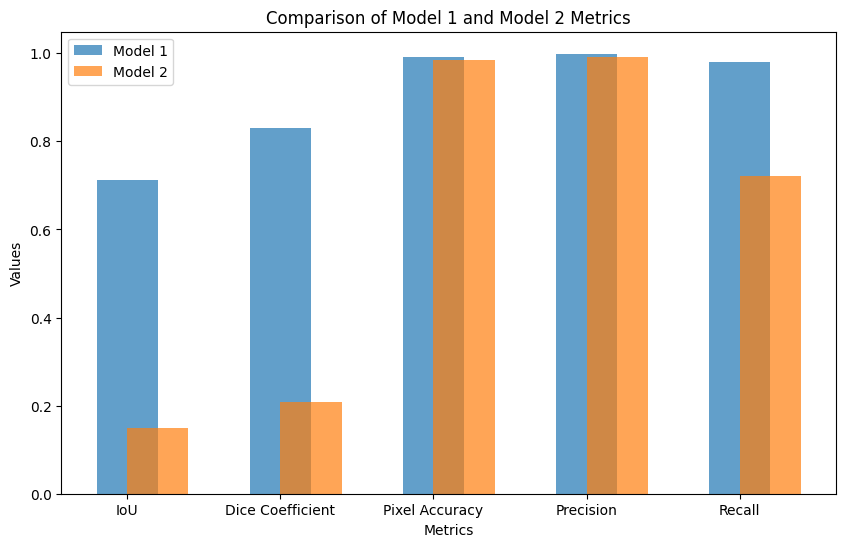

In [ ]:
labels = ['IoU', 'Dice Coefficient', 'Pixel Accuracy','Precision','Recall' ]
model1_metrics = [model1_iou, model1_dice_coefficient, model1_pixel_accuracy,model1_precision,model1_recall  ]
model2_metrics = [model2_iou, model2_dice_coefficient, model2_pixel_accuracy,model2_precision,model2_recall]

x = range(len(labels))

plt.figure(figsize=(10, 6))

plt.bar(x, model1_metrics, width=0.4, label='Model 1', align='center', alpha=0.7)
plt.bar(x, model2_metrics, width=0.4, label='Model 2', align='edge', alpha=0.7)

plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Comparison of Model 1 and Model 2 Metrics')
plt.xticks(x, labels)
plt.legend()
plt.show()

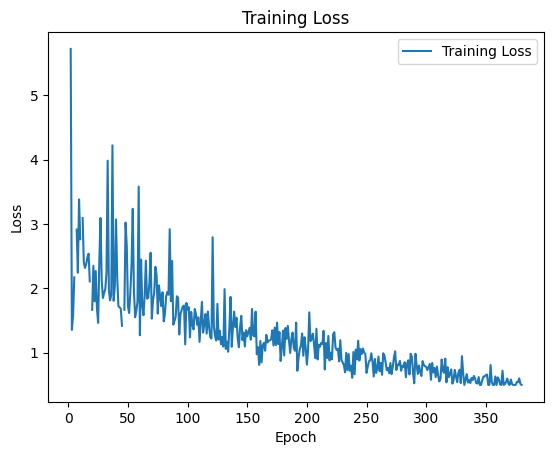

In [ ]:
train_loss = history.history['loss']

plt.plot(train_loss, label='Training Loss')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


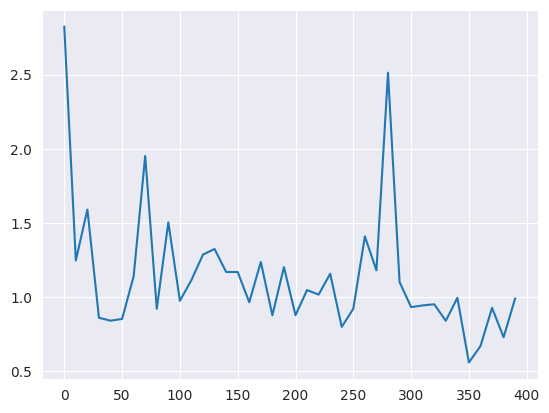

In [ ]:
plt.plot(epochs, loss_list)
plt.show()

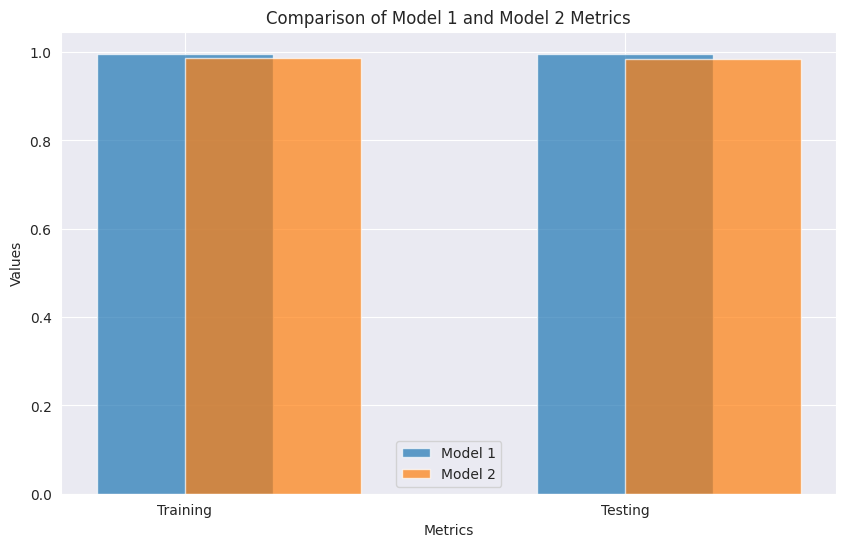

In [ ]:
labels = ['Training', 'Testing' ]
model1_metrics = [model1_training, model1_testing ]
model2_metrics = [model2_training, model2_testing]

x = range(len(labels))

plt.figure(figsize=(10, 6))

plt.bar(x, model1_metrics, width=0.4, label='Model 1', align='center', alpha=0.7)
plt.bar(x, model2_metrics, width=0.4, label='Model 2', align='edge', alpha=0.7)

plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Comparison of Model 1 and Model 2 Metrics')
plt.xticks(x, labels)
plt.legend()
plt.show()